<a href="https://colab.research.google.com/github/cinthylli/100-Days-Of-ML-Code/blob/master/fifa_22_player_overall_predictions.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Import Libraries**

In [ ]:
import os
for dirname, _, filenames in os.walk(r'C:\Users\57315\Downloads\ea\fifa_2022_datasets'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [ ]:
# data analysis and wrangling
import pandas as pd
import numpy as np
import random as rnd

# visualization
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# machine learning
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeClassifier


# **Read Dataset**

In [ ]:
df = pd.read_csv("/kaggle/input/fifa-22-complete-player-dataset/players_22.csv",low_memory=False)
df.head(5)

,sofifa_id,player_url,short_name,long_name,player_positions,overall,potential,value_eur,wage_eur,age,...,lcb,cb,rcb,rb,gk,player_face_url,club_logo_url,club_flag_url,nation_logo_url,nation_flag_url
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,"RW, ST, CF",93,93,78000000.0,320000.0,34,...,50+3,50+3,50+3,61+3,19+3,https://cdn.sofifa.net/players/158/023/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,https://cdn.sofifa.net/teams/1369/60.png,https://cdn.sofifa.net/flags/ar.png
1,188545,https://sofifa.com/player/188545/robert-lewand...,R. Lewandowski,Robert Lewandowski,ST,92,92,119500000.0,270000.0,32,...,60+3,60+3,60+3,61+3,19+3,https://cdn.sofifa.net/players/188/545/22_120.png,https://cdn.sofifa.net/teams/21/60.png,https://cdn.sofifa.net/flags/de.png,https://cdn.sofifa.net/teams/1353/60.png,https://cdn.sofifa.net/flags/pl.png
2,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,"ST, LW",91,91,45000000.0,270000.0,36,...,53+3,53+3,53+3,60+3,20+3,https://cdn.sofifa.net/players/020/801/22_120.png,https://cdn.sofifa.net/teams/11/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1354/60.png,https://cdn.sofifa.net/flags/pt.png
3,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Júnior,"LW, CAM",91,91,129000000.0,270000.0,29,...,50+3,50+3,50+3,62+3,20+3,https://cdn.sofifa.net/players/190/871/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,NaN,https://cdn.sofifa.net/flags/br.png
4,192985,https://sofifa.com/player/192985/kevin-de-bruy...,K. De Bruyne,Kevin De Bruyne,"CM, CAM",91,91,125500000.0,350000.0,30,...,69+3,69+3,69+3,75+3,21+3,https://cdn.sofifa.net/players/192/985/22_120.png,https://cdn.sofifa.net/teams/10/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1325/60.png,https://cdn.sofifa.net/flags/be.png


## Data Preprocesing 1

### Delete columns that include url

In [ ]:
df = df[df.columns.drop(list(df.filter(regex='url')))]
        
df.shape

(19239, 104)

In [ ]:
df.dtypes

sofifa_id            int64
short_name          object
long_name           object
player_positions    object
overall              int64
                     ...  
lcb                 object
cb                  object
rcb                 object
rb                  object
gk                  object
Length: 104, dtype: object

### Will see what columns have more that 50% missing values so we can drop it 

In [ ]:
cols_to_drop = []
for i in df.columns:
    missing = np.abs((df[i].count() - df[i].shape[0])/df[i].shape[0] * 100)
    if missing > 80:
        print('{} - {}%'.format(i, round(missing)))
        cols_to_drop.append(i)

club_loaned_from - 94%
nation_team_id - 96%
nation_position - 96%
nation_jersey_number - 96%
player_tags - 93%
goalkeeping_speed - 89%


### **Columns that we might drop:** 
* club_loaned_from,nation_team_id,nation_position,nation_jersey_number,player_tags,player_traits.goalkeeping_speed

In [ ]:
df.drop(columns=cols_to_drop,inplace=True)
print(df.shape)

(19239, 98)


In [ ]:
df.rename(columns={'skill_moves':'skills'},inplace=True)

In [ ]:
filter = ['sofifa_id','skill_','movement_','defending_','goalkeeping_','attacking_','power_','mentality_']

for i in filter:
    df = df[df.columns.drop(list(df.filter(regex=i)))]

df.shape

(19239, 63)

In [ ]:
df.columns

Index(['short_name', 'long_name', 'player_positions', 'overall', 'potential',
       'value_eur', 'wage_eur', 'age', 'dob', 'height_cm', 'weight_kg',
       'club_team_id', 'club_name', 'league_name', 'league_level',
       'club_position', 'club_jersey_number', 'club_joined',
       'club_contract_valid_until', 'nationality_id', 'nationality_name',
       'preferred_foot', 'weak_foot', 'skills', 'international_reputation',
       'work_rate', 'body_type', 'real_face', 'release_clause_eur',
       'player_traits', 'pace', 'shooting', 'passing', 'dribbling',
       'defending', 'physic', 'ls', 'st', 'rs', 'lw', 'lf', 'cf', 'rf', 'rw',
       'lam', 'cam', 'ram', 'lm', 'lcm', 'cm', 'rcm', 'rm', 'lwb', 'ldm',
       'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb', 'gk'],
      dtype='object')

In [ ]:
df1 = df[['short_name','age','height_cm','weight_kg','nationality_name','club_name','overall','potential','league_name','league_level',
          'value_eur','wage_eur','player_positions','preferred_foot','international_reputation',
          'skills', 'work_rate', 'pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic']]

In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19239 entries, 0 to 19238
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   short_name                19239 non-null  object 
 1   age                       19239 non-null  int64  
 2   height_cm                 19239 non-null  int64  
 3   weight_kg                 19239 non-null  int64  
 4   nationality_name          19239 non-null  object 
 5   club_name                 19178 non-null  object 
 6   overall                   19239 non-null  int64  
 7   potential                 19239 non-null  int64  
 8   league_name               19178 non-null  object 
 9   league_level              19178 non-null  float64
 10  value_eur                 19165 non-null  float64
 11  wage_eur                  19178 non-null  float64
 12  player_positions          19239 non-null  object 
 13  preferred_foot            19239 non-null  object 
 14  intern

In [ ]:
df1.isnull().sum()

short_name                     0
age                            0
height_cm                      0
weight_kg                      0
nationality_name               0
club_name                     61
overall                        0
potential                      0
league_name                   61
league_level                  61
value_eur                     74
wage_eur                      61
player_positions               0
preferred_foot                 0
international_reputation       0
skills                         0
work_rate                      0
pace                        2132
shooting                    2132
passing                     2132
dribbling                   2132
defending                   2132
physic                      2132
dtype: int64

## Exploratory data analysis

In [ ]:
player_positions = df1['player_positions'].value_counts().head(20)
player_positions

CB         2423
GK         2132
ST         1770
CDM, CM     953
CM          726
CM, CDM     687
LB          616
RB          576
CB, RB      295
CDM         294
CAM, CM     249
CB, LB      232
CAM         219
LB, LM      206
LM          206
CM, CAM     203
CB, CDM     202
RM, LM      196
RM          196
LM, RM      168
Name: player_positions, dtype: int64

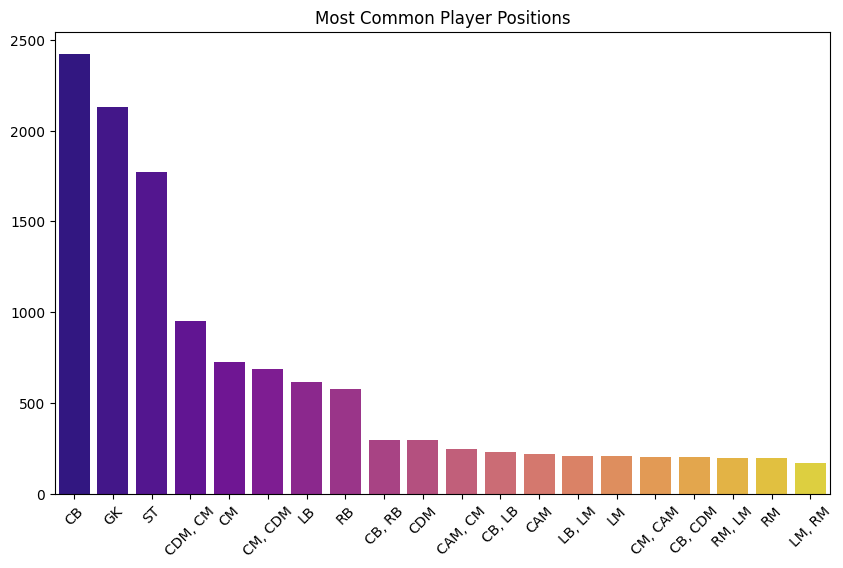

In [ ]:
plt.figure(figsize=(10, 6))
sns.barplot(x=player_positions.index, y=player_positions.values,palette="plasma",capsize=.2)

plt.title('Most Common Player Positions')
plt.xticks(rotation=45)
plt.show()

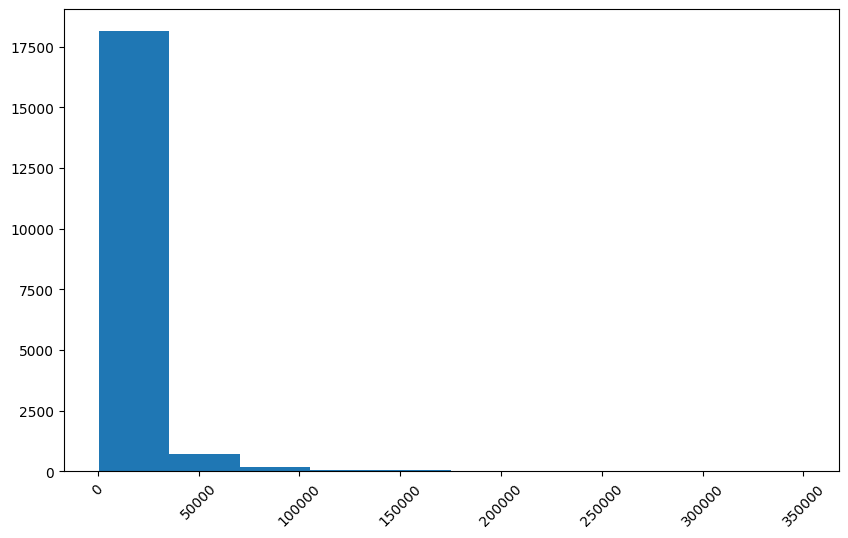

In [ ]:
plt.figure(figsize=(10, 6))
plt.hist(x=df1.wage_eur,bins=10)


plt.xticks(rotation=45)
plt.show()

In [ ]:
country_players = df1['nationality_name'].value_counts().head(10)
country_players

England          1719
Germany          1214
Spain            1086
France            980
Argentina         960
Brazil            897
Japan             546
Netherlands       439
United States     413
Poland            403
Name: nationality_name, dtype: int64

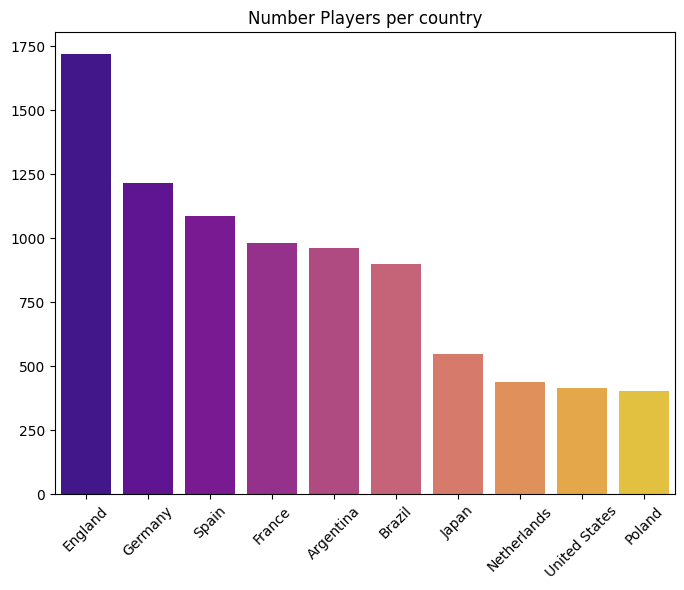

In [ ]:
plt.figure(figsize=(8, 6))
sns.barplot(x=country_players.index, y=country_players.values,palette="plasma",capsize=.2)

plt.title('Number Players per country')
plt.xticks(rotation=45)
plt.show()

In [ ]:
hg_skills = df1[df1.skills == 5]
hg_skills['nationality_name'].value_counts()

Brazil                 12
Portugal                6
France                  6
Argentina               6
England                 2
Morocco                 2
Colombia                2
Congo DR                2
Ukraine                 1
Republic of Ireland     1
Thailand                1
Gambia                  1
Romania                 1
Germany                 1
Switzerland             1
Mexico                  1
Norway                  1
Côte d'Ivoire           1
Slovenia                1
Sweden                  1
Netherlands             1
Algeria                 1
Spain                   1
Scotland                1
Name: nationality_name, dtype: int64

### Relationship between skills  and Wages

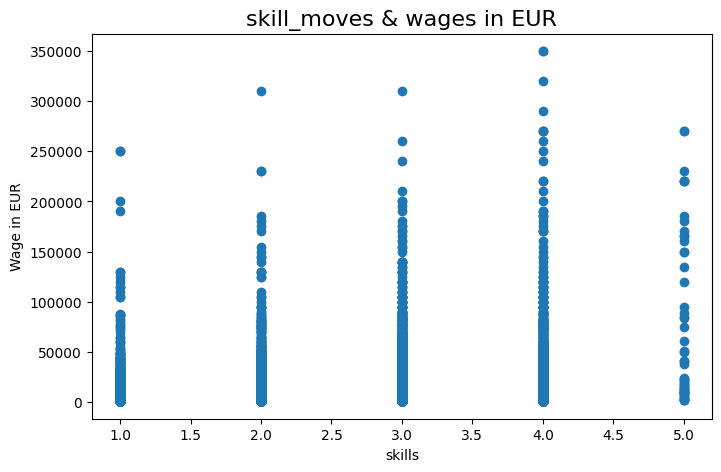

In [ ]:
#Relationship between skills  and Wages

fig, ax = plt.subplots(figsize=(8,5))
plt.scatter(data = df1, x= 'skills', y='wage_eur')
plt.xlabel("skills") 
plt.ylabel("Wage in EUR")
plt.title("skill_moves & wages in EUR", fontsize = 16)
plt.show()

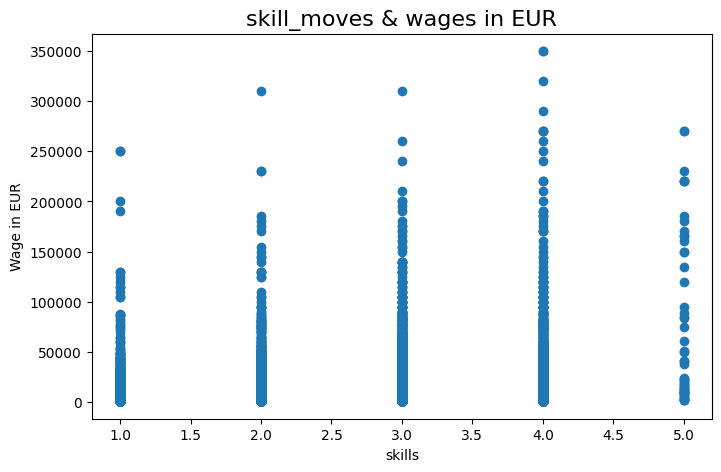

In [ ]:
#Relationship between skills  and Wages

fig, ax = plt.subplots(figsize=(8,5))
plt.scatter(data = df1, x= 'skills', y='wage_eur')
plt.xlabel("skills") 
plt.ylabel("Wage in EUR")
plt.title("skill_moves & wages in EUR", fontsize = 16)
plt.show()

### Relationship between international_reputation  and wages

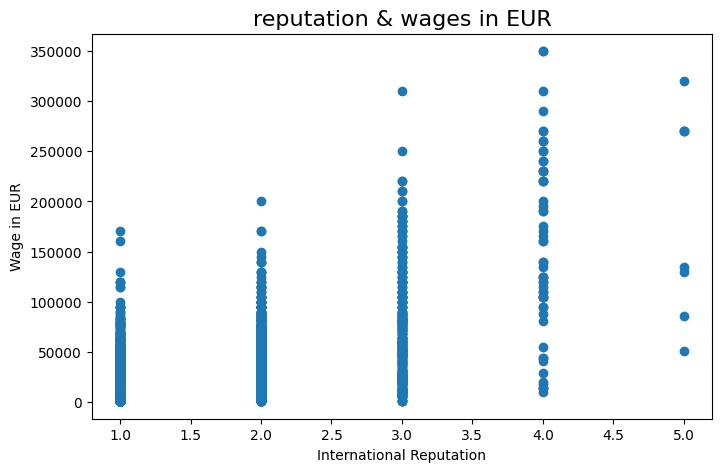

In [ ]:
#Relationship between international_reputation  and wages

fig, ax = plt.subplots(figsize=(8,5))
plt.scatter(data = df1, x= 'international_reputation', y='wage_eur')
plt.xlabel("International Reputation") 
plt.ylabel("Wage in EUR")
plt.title("reputation & wages in EUR", fontsize = 16)
plt.show()

### Relationship between potential  and wages

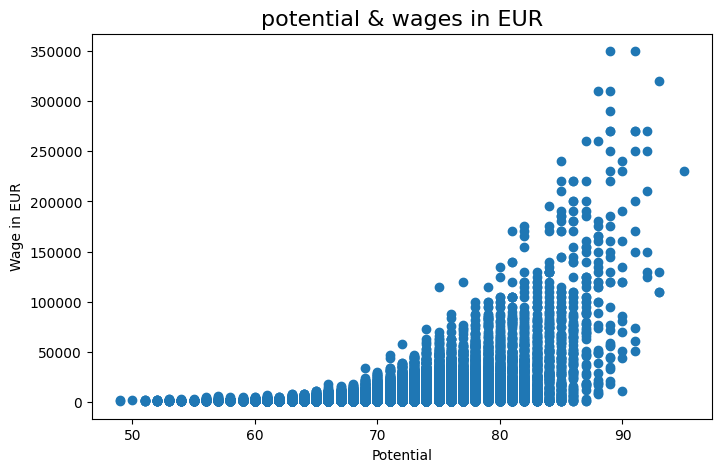

In [ ]:
#Relationship between potential  and wages

fig, ax = plt.subplots(figsize=(8,5))
plt.scatter(data = df1, x= 'potential', y='wage_eur')
plt.xlabel("Potential") 
plt.ylabel("Wage in EUR")
plt.title("potential & wages in EUR", fontsize = 16)
plt.show()

### Relationship between overall  and wages

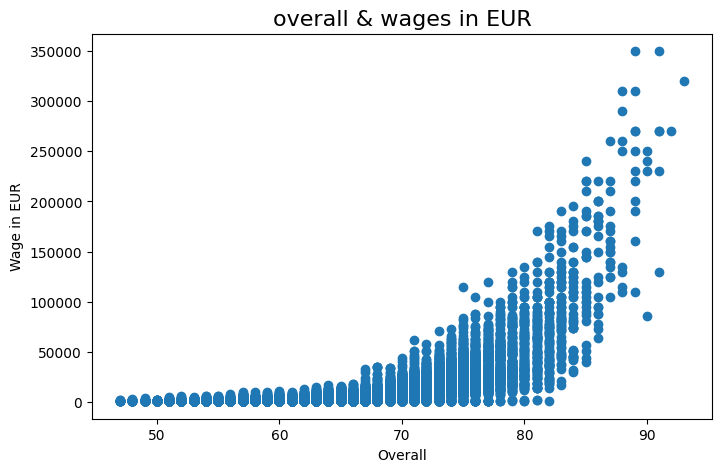

In [ ]:
#Relationship between overall  and wages

fig, ax = plt.subplots(figsize=(8,5))
plt.scatter(data = df, x= 'overall', y='wage_eur')
plt.xlabel("Overall") 
plt.ylabel("Wage in EUR")
plt.title("overall & wages in EUR", fontsize = 16)
plt.show()

### Relationship between age  and wages

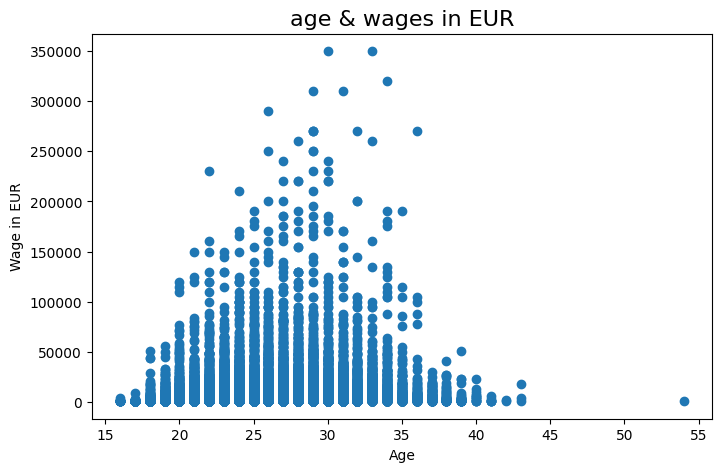

In [ ]:
#Relationship between age  and wages

fig, ax = plt.subplots(figsize=(8,5))
plt.scatter(data = df, x= 'age', y='wage_eur')
plt.xlabel("Age") 
plt.ylabel("Wage in EUR")
plt.title("age & wages in EUR", fontsize = 16)
plt.show()

In [ ]:
df1.columns

Index(['short_name', 'age', 'height_cm', 'weight_kg', 'nationality_name',
       'club_name', 'overall', 'potential', 'league_name', 'league_level',
       'value_eur', 'wage_eur', 'player_positions', 'preferred_foot',
       'international_reputation', 'skills', 'work_rate', 'pace', 'shooting',
       'passing', 'dribbling', 'defending', 'physic'],
      dtype='object')

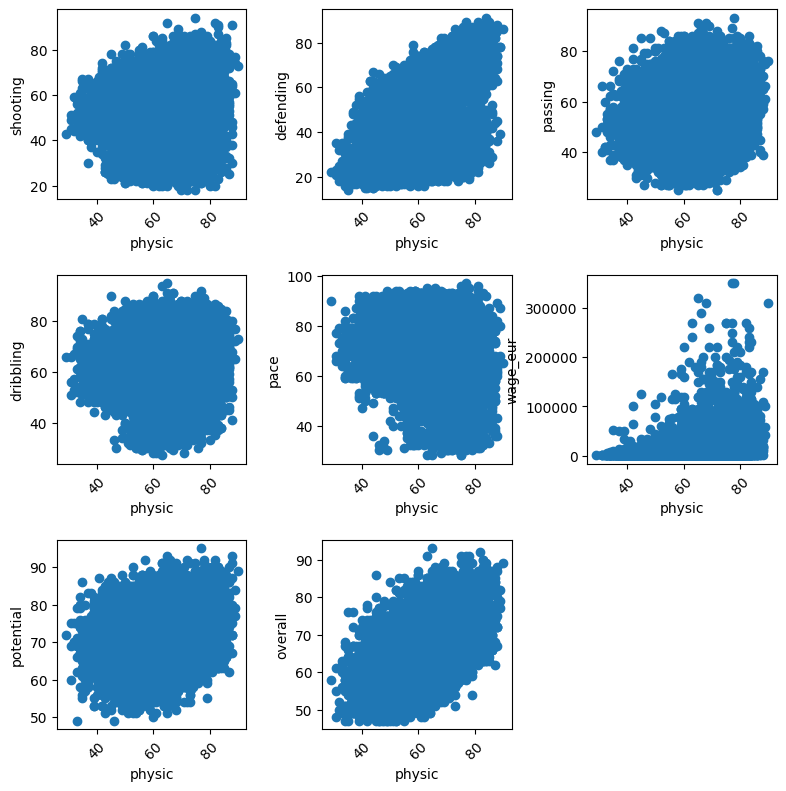

In [ ]:
df_x = df[['shooting','defending','passing','dribbling','pace','wage_eur','potential','overall']]

plt.figure(figsize=(9, 9))

plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.4,
                    hspace=0.4)

width = 3
height = 3
index = 1
for i in df_x.columns:
    plt.subplot(height, width, index)
    plt.scatter(x=df['physic'],y=df_x[i])
    plt.xlabel('physic')
    plt.ylabel(i)
    plt.xticks(rotation=45)
    index = index + 1

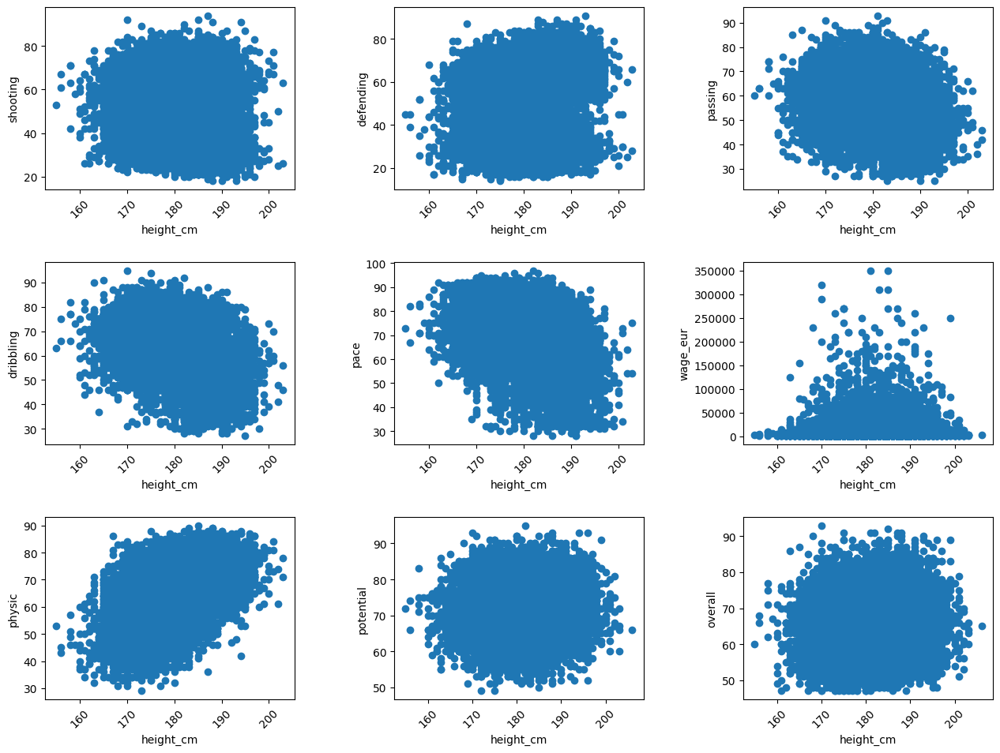

In [ ]:
df_x = df[['shooting','defending','passing','dribbling','pace','wage_eur','physic','potential','overall']]

plt.figure(figsize=(15,15))

plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.4,
                    hspace=0.4)

width = 3
height = 4
index = 1
for i in df_x.columns:
    plt.subplot(height, width, index)
    plt.scatter(x=df['height_cm'],y=df_x[i])
    plt.xlabel('height_cm')
    plt.ylabel(i)
    plt.xticks(rotation=45)
    index = index + 1

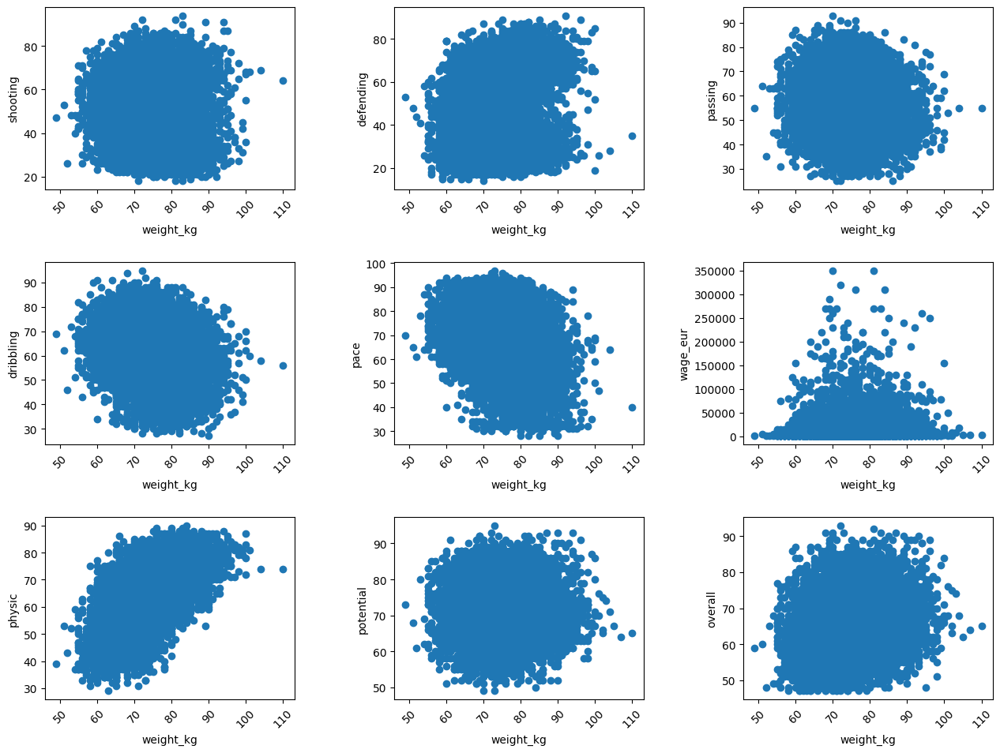

In [ ]:
df_x = df1[['shooting','defending','passing','dribbling','pace','wage_eur','physic','potential','overall']]

plt.figure(figsize=(15,15))

plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.4,
                    hspace=0.4)

width = 3
height = 4
index = 1
for i in df_x.columns:
    plt.subplot(height, width, index)
    plt.scatter(x=df['weight_kg'],y=df_x[i])
    plt.xlabel('weight_kg')
    plt.ylabel(i)
    plt.xticks(rotation=45)
    index = index + 1

### Age distribution

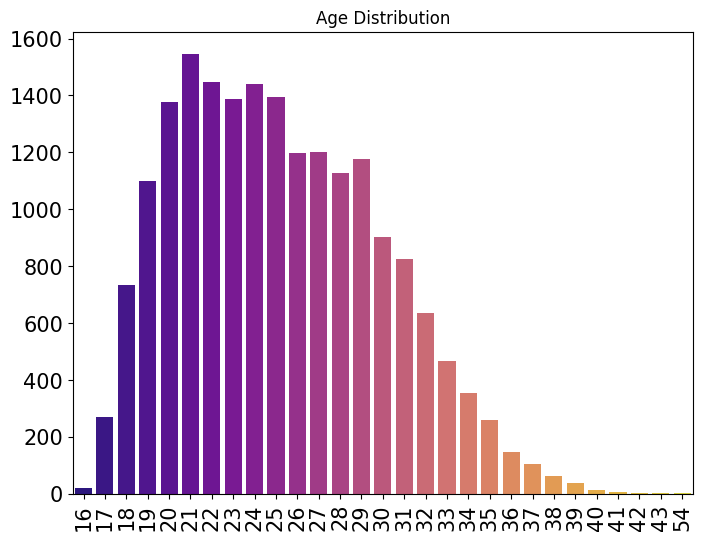

In [ ]:
plt.figure(figsize=(8, 6))
sns.barplot(x=df1.age.value_counts().index, y=df1.age.value_counts().values,palette="plasma",capsize=.2)

plt.xticks(fontsize=15, rotation=90)
plt.yticks(fontsize=15)
plt.title('Age Distribution')
plt.show()

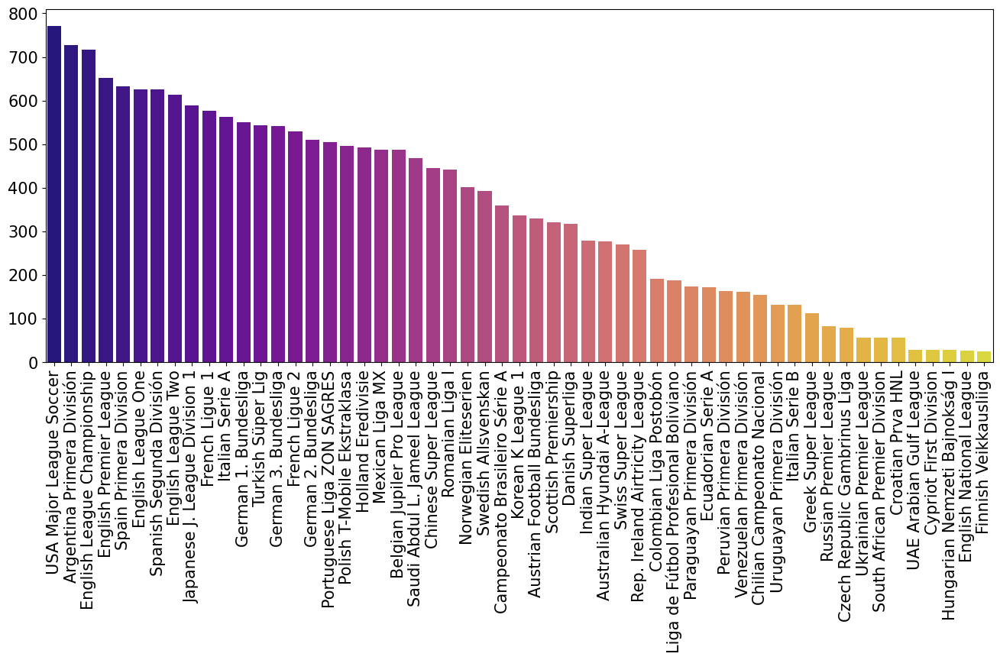

In [ ]:
plt.figure(figsize=(16, 6))
sns.barplot(x=df1.league_name.value_counts().index, y=df1.league_name.value_counts().values,palette="plasma",capsize=.2)

plt.xticks(fontsize=15, rotation=90)
plt.yticks(fontsize=15)
plt.show()

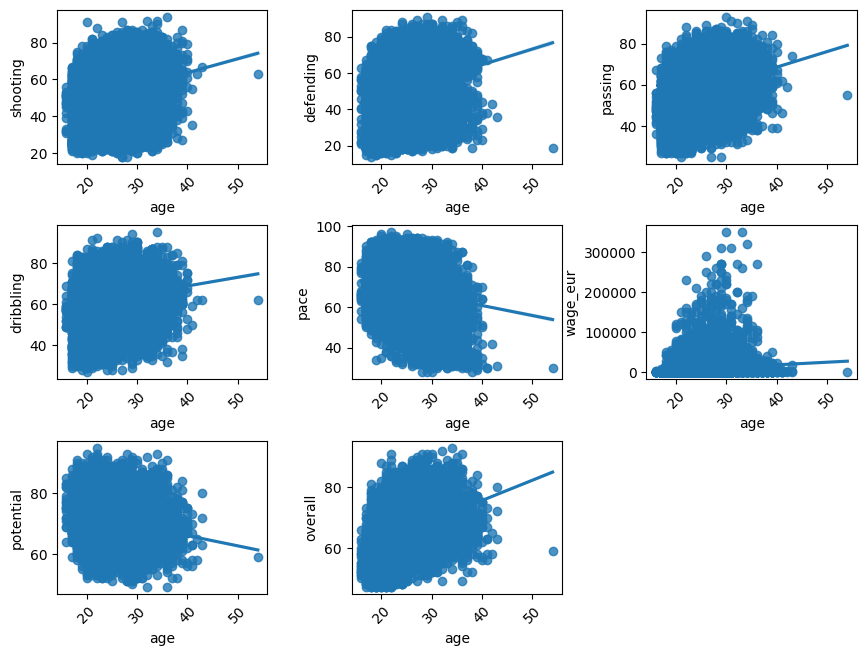

In [ ]:
df_x = df1[['shooting','defending','passing','dribbling','pace','wage_eur','potential','overall']]

plt.figure(figsize=(10,10))

plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.4,
                    hspace=0.4)

width = 3
height = 4
index = 1
for i in df_x.columns:
    plt.subplot(height, width, index)
    sns.regplot(x=df['age'],y=df_x[i])
    plt.xlabel('age')
    plt.ylabel(i)
    plt.xticks(rotation=45)
    index = index + 1

### Overall score of the players

In [ ]:
# Overall score of the players
df1.sort_values(by='overall',ascending=False)[["short_name","overall","age"]].head(100)

,short_name,overall,age
0,L. Messi,93,34
1,R. Lewandowski,92,32
2,Cristiano Ronaldo,91,36
3,Neymar Jr,91,29
4,K. De Bruyne,91,30
...,...,...,...
80,K. Walker,85,31
81,P. Aubameyang,85,32
130,J. Giménez,84,26
120,Felipe,84,32


L. Messi, R. Lewandowski, Cristiano Ronaldo, Neymar Jr, K. De Bruyne,J. Oblak and K. Mbappé has highest overall score than the rest of the players.

### Overall score of the players

In [ ]:
# Overall score of the players

#We filter players under or 25 
young_players = df1[df1['age'] <= 25]

sorted_players = young_players.sort_values(by='potential', ascending=False)

potential = sorted_players[['short_name', 'potential', 'age']].head(100)

potential

,short_name,potential,age
6,K. Mbappé,95,22
29,E. Haaland,93,20
21,G. Donnarumma,93,22
43,F. de Jong,92,24
44,T. Alexander-Arnold,92,22
...,...,...,...
503,L. Díaz,86,24
504,N. Vlašić,86,23
2398,P. De la Vega,86,20
1133,R. Araujo,86,22


K.Mbappé, E.Haaland, G. Donnarumma, G. Donnarumma and T. Alexander-Arnold are the players unders or 25 with the highest potential 

In [ ]:
top_players = df1.sort_values(by='overall',ascending=False).head(100)
top_players

,short_name,age,height_cm,weight_kg,nationality_name,club_name,overall,potential,league_name,league_level,...,preferred_foot,international_reputation,skills,work_rate,pace,shooting,passing,dribbling,defending,physic
0,L. Messi,34,170,72,Argentina,Paris Saint-Germain,93,93,French Ligue 1,1.0,...,Left,5,4,Medium/Low,85.0,92.0,91.0,95.0,34.0,65.0
1,R. Lewandowski,32,185,81,Poland,FC Bayern München,92,92,German 1. Bundesliga,1.0,...,Right,5,4,High/Medium,78.0,92.0,79.0,86.0,44.0,82.0
2,Cristiano Ronaldo,36,187,83,Portugal,Manchester United,91,91,English Premier League,1.0,...,Right,5,5,High/Low,87.0,94.0,80.0,88.0,34.0,75.0
3,Neymar Jr,29,175,68,Brazil,Paris Saint-Germain,91,91,French Ligue 1,1.0,...,Right,5,5,High/Medium,91.0,83.0,86.0,94.0,37.0,63.0
4,K. De Bruyne,30,181,70,Belgium,Manchester City,91,91,English Premier League,1.0,...,Right,4,4,High/High,76.0,86.0,93.0,88.0,64.0,78.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80,K. Walker,31,183,83,England,Manchester City,85,85,English Premier League,1.0,...,Right,3,3,High/High,92.0,63.0,76.0,78.0,80.0,82.0
81,P. Aubameyang,32,187,80,Gabon,Arsenal,85,85,English Premier League,1.0,...,Right,3,4,Medium/Low,89.0,85.0,75.0,80.0,35.0,69.0
130,J. Giménez,26,185,79,Uruguay,Atlético de Madrid,84,88,Spain Primera Division,1.0,...,Right,2,2,Medium/High,69.0,45.0,57.0,59.0,86.0,80.0
120,Felipe,32,190,84,Brazil,Atlético de Madrid,84,84,Spain Primera Division,1.0,...,Right,3,2,Low/High,61.0,41.0,58.0,62.0,85.0,84.0


### Age distribution of top players

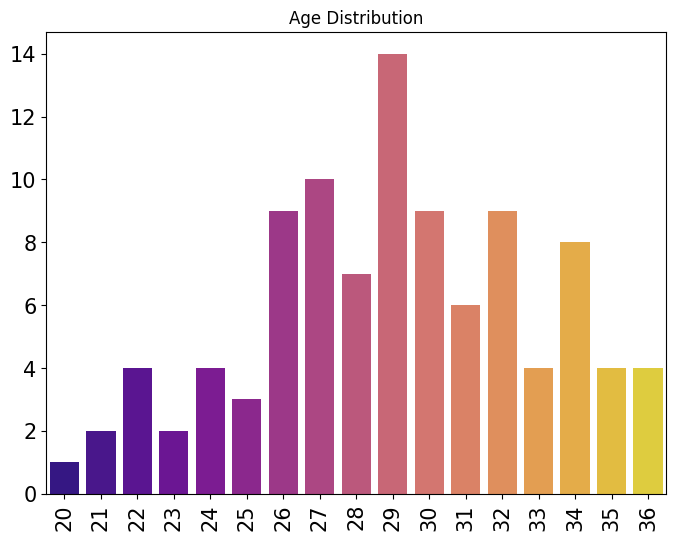

In [ ]:
plt.figure(figsize=(8, 6))
sns.barplot(x=top_players.age.value_counts().index, y=top_players.age.value_counts().values,palette="plasma",capsize=.2)

plt.xticks(fontsize=15, rotation=90)
plt.yticks(fontsize=15)
plt.title('Age Distribution')
plt.show()

### League distribution of top players

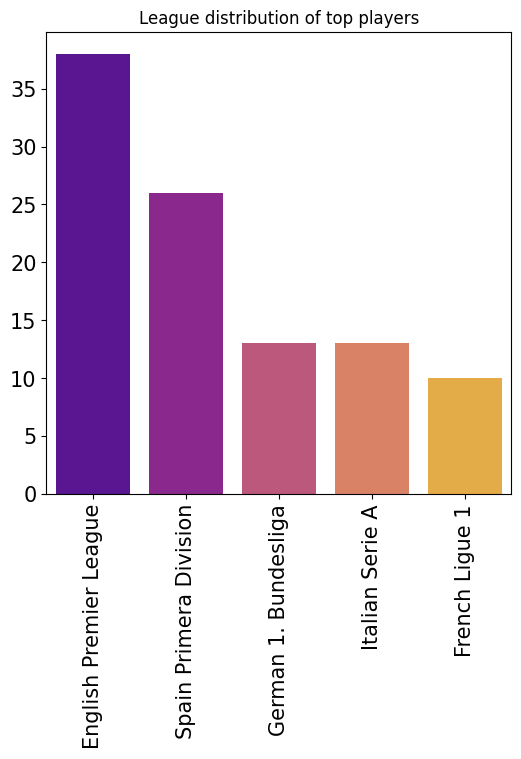

In [ ]:
plt.figure(figsize=(6, 6))
sns.barplot(x=top_players.league_name.value_counts().index, y=top_players.league_name.value_counts().values,palette="plasma",capsize=.2)


plt.xticks(fontsize=15, rotation=90)
plt.yticks(fontsize=15)
plt.title("League distribution of top players")
plt.show()

### Wage distribution of top players

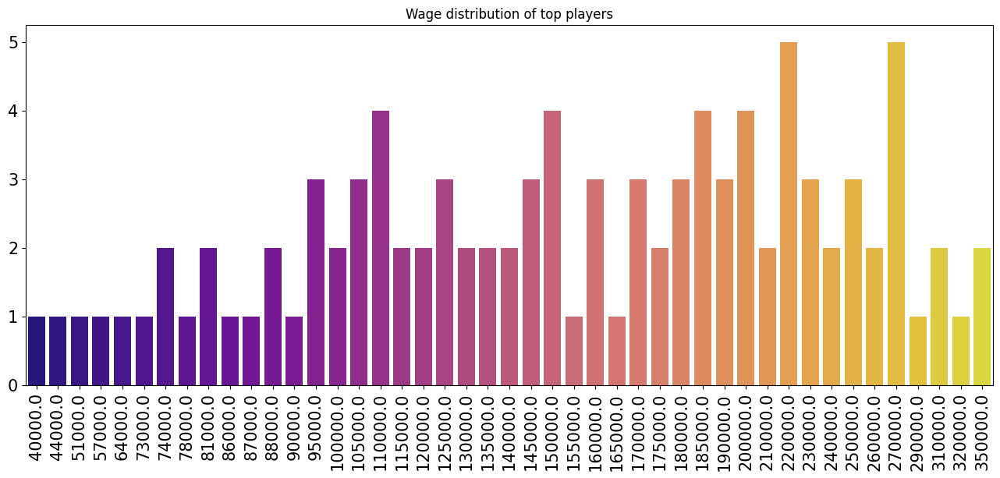

In [ ]:
plt.figure(figsize=(16, 6))
sns.barplot(x=top_players.wage_eur.value_counts().index, y=top_players.wage_eur.value_counts().values,palette="plasma",capsize=.2)


plt.xticks(fontsize=15, rotation=90)
plt.yticks(fontsize=15)
plt.title("Wage distribution of top players")
plt.show()

In [ ]:
print("Top 100 players")
x = ['overall','potential','skills','wage_eur','pace','physic','age','height_cm','weight_kg','international_reputation']
for i in x:
    print("Mean {} :  {}".format(i,top_players[i].mean()))

Top 100 players
Mean overall :  86.86
Mean potential :  87.85
Mean skills :  3.06
Mean wage_eur :  166360.0
Mean pace :  76.3529411764706
Mean physic :  75.03529411764706
Mean age :  29.05
Mean height_cm :  182.84
Mean weight_kg :  78.02
Mean international_reputation :  3.41


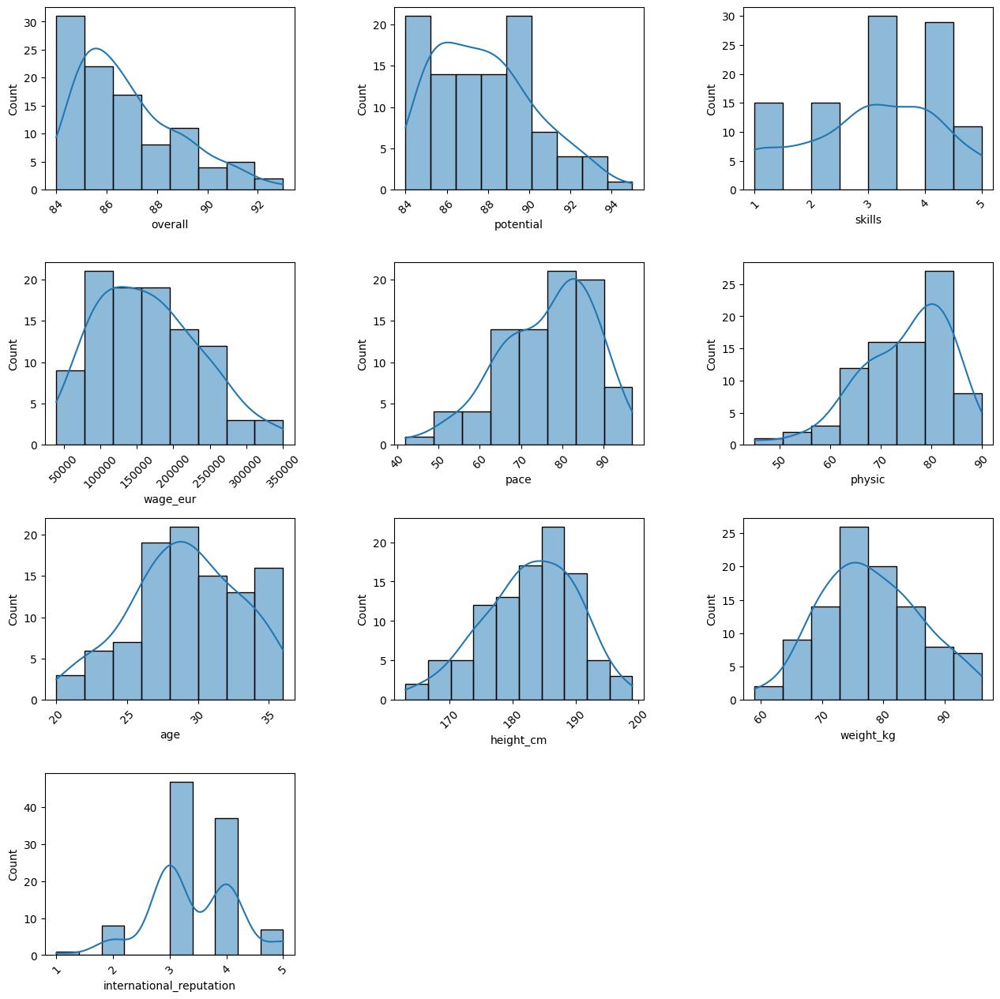

In [ ]:
plt.figure(figsize=(15,15))
x = ['overall','potential','skills','wage_eur','pace','physic','age','height_cm','weight_kg','international_reputation']
plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.4,
                    hspace=0.4)

width = 3
height = 4
index = 1
for i in x:
    plt.subplot(height, width, index)
    sns.histplot(x=top_players[i], kde=True)
    plt.xlabel(i)
    plt.xticks(rotation=45)
    index = index + 1

## Data Preprocesing 2

#### **After seeing that we have a lot of unique player_positions if a player has 'RW, ST, CF' we are gonna assum that the player position is 'RW'**

In [ ]:
df1['player_positions'] = df1['player_positions'].apply(lambda x: x.split(',')[0].strip())

unique_positions = df1['player_positions'].unique()
print(unique_positions)

['RW' 'ST' 'LW' 'CM' 'GK' 'CDM' 'CF' 'LM' 'CB' 'CAM' 'LB' 'RB' 'RM' 'LWB'
 'RWB']


/tmp/ipykernel_34/3538338601.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['player_positions'] = df1['player_positions'].apply(lambda x: x.split(',')[0].strip())


#### **As we can see, the columnn league_level will be used instead of league_name and club_name**

In [ ]:
df1 = df1.drop(columns=['nationality_name','club_name','league_name','short_name'])

In [ ]:
df1[df1.league_level == 1].head(5)

,age,height_cm,weight_kg,overall,potential,league_level,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,skills,work_rate,pace,shooting,passing,dribbling,defending,physic
0,34,170,72,93,93,1.0,78000000.0,320000.0,RW,Left,5,4,Medium/Low,85.0,92.0,91.0,95.0,34.0,65.0
1,32,185,81,92,92,1.0,119500000.0,270000.0,ST,Right,5,4,High/Medium,78.0,92.0,79.0,86.0,44.0,82.0
2,36,187,83,91,91,1.0,45000000.0,270000.0,ST,Right,5,5,High/Low,87.0,94.0,80.0,88.0,34.0,75.0
3,29,175,68,91,91,1.0,129000000.0,270000.0,LW,Right,5,5,High/Medium,91.0,83.0,86.0,94.0,37.0,63.0
4,30,181,70,91,91,1.0,125500000.0,350000.0,CM,Right,4,4,High/High,76.0,86.0,93.0,88.0,64.0,78.0


In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19239 entries, 0 to 19238
Data columns (total 19 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   age                       19239 non-null  int64  
 1   height_cm                 19239 non-null  int64  
 2   weight_kg                 19239 non-null  int64  
 3   overall                   19239 non-null  int64  
 4   potential                 19239 non-null  int64  
 5   league_level              19178 non-null  float64
 6   value_eur                 19165 non-null  float64
 7   wage_eur                  19178 non-null  float64
 8   player_positions          19239 non-null  object 
 9   preferred_foot            19239 non-null  object 
 10  international_reputation  19239 non-null  int64  
 11  skills                    19239 non-null  int64  
 12  work_rate                 19239 non-null  object 
 13  pace                      17107 non-null  float64
 14  shooti

#### Gonna check missing values and how to impute those values

In [ ]:
missing_percentage = (df1.isnull().sum() / len(df1)) * 100
print(missing_percentage)

age                          0.000000
height_cm                    0.000000
weight_kg                    0.000000
overall                      0.000000
potential                    0.000000
league_level                 0.317064
value_eur                    0.384635
wage_eur                     0.317064
player_positions             0.000000
preferred_foot               0.000000
international_reputation     0.000000
skills                       0.000000
work_rate                    0.000000
pace                        11.081657
shooting                    11.081657
passing                     11.081657
dribbling                   11.081657
defending                   11.081657
physic                      11.081657
dtype: float64


####  We are gonna preprocess the preffered_foot using one-hot encoder

In [ ]:
from sklearn.preprocessing import OneHotEncoder

encoder = OneHotEncoder(sparse=False)

encoded_data = encoder.fit_transform(df1[['preferred_foot']])

encoded_df = pd.DataFrame(encoded_data, columns=encoder.categories_[0])

data_encoded = pd.concat([df1, encoded_df], axis=1)

data_encoded

/opt/conda/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


,age,height_cm,weight_kg,overall,potential,league_level,value_eur,wage_eur,player_positions,preferred_foot,...,skills,work_rate,pace,shooting,passing,dribbling,defending,physic,Left,Right
0,34,170,72,93,93,1.0,78000000.0,320000.0,RW,Left,...,4,Medium/Low,85.0,92.0,91.0,95.0,34.0,65.0,1.0,0.0
1,32,185,81,92,92,1.0,119500000.0,270000.0,ST,Right,...,4,High/Medium,78.0,92.0,79.0,86.0,44.0,82.0,0.0,1.0
2,36,187,83,91,91,1.0,45000000.0,270000.0,ST,Right,...,5,High/Low,87.0,94.0,80.0,88.0,34.0,75.0,0.0,1.0
3,29,175,68,91,91,1.0,129000000.0,270000.0,LW,Right,...,5,High/Medium,91.0,83.0,86.0,94.0,37.0,63.0,0.0,1.0
4,30,181,70,91,91,1.0,125500000.0,350000.0,CM,Right,...,4,High/High,76.0,86.0,93.0,88.0,64.0,78.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19234,22,180,64,47,52,1.0,70000.0,1000.0,CDM,Right,...,2,Medium/Medium,58.0,35.0,46.0,48.0,42.0,49.0,0.0,1.0
19235,19,175,70,47,59,1.0,110000.0,500.0,CM,Right,...,2,Medium/Medium,59.0,39.0,50.0,46.0,41.0,51.0,0.0,1.0
19236,21,178,72,47,55,1.0,100000.0,500.0,CM,Right,...,2,Medium/Medium,60.0,37.0,45.0,49.0,41.0,52.0,0.0,1.0
19237,19,173,66,47,60,1.0,110000.0,500.0,ST,Right,...,2,Medium/Medium,68.0,46.0,36.0,48.0,15.0,42.0,0.0,1.0


#### We are gonna use label encoder for work_rate and player_positions label_encoder

In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for i in data_encoded.select_dtypes(['object']):
    data_encoded[i] =  le.fit_transform(data_encoded[i])

In [ ]:
data_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19239 entries, 0 to 19238
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   age                       19239 non-null  int64  
 1   height_cm                 19239 non-null  int64  
 2   weight_kg                 19239 non-null  int64  
 3   overall                   19239 non-null  int64  
 4   potential                 19239 non-null  int64  
 5   league_level              19178 non-null  float64
 6   value_eur                 19165 non-null  float64
 7   wage_eur                  19178 non-null  float64
 8   player_positions          19239 non-null  int64  
 9   preferred_foot            19239 non-null  int64  
 10  international_reputation  19239 non-null  int64  
 11  skills                    19239 non-null  int64  
 12  work_rate                 19239 non-null  int64  
 13  pace                      17107 non-null  float64
 14  shooti

#### We will use KNNImputer to impute the missing values in our dataset

In [ ]:
from sklearn.impute import KNNImputer
from sklearn.metrics import mean_squared_error, mean_absolute_error

columns_with_missing_values = data_encoded.columns[data_encoded.isnull().any()].tolist()
columns_with_missing_values

df_imputed = data_encoded.copy()

imputation_data = df_imputed[columns_with_missing_values].copy()

imputer = KNNImputer(n_neighbors=6)

imputed_data = imputer.fit_transform(imputation_data)

df_imputed[columns_with_missing_values] = imputed_data

In [ ]:
missing_percentage = (df_imputed.isnull().sum() / len(df_imputed)) * 100
print(missing_percentage)

age                         0.0
height_cm                   0.0
weight_kg                   0.0
overall                     0.0
potential                   0.0
league_level                0.0
value_eur                   0.0
wage_eur                    0.0
player_positions            0.0
preferred_foot              0.0
international_reputation    0.0
skills                      0.0
work_rate                   0.0
pace                        0.0
shooting                    0.0
passing                     0.0
dribbling                   0.0
defending                   0.0
physic                      0.0
Left                        0.0
Right                       0.0
dtype: float64


**We are gonna convert the float columns (value_eur,wage_eur,league_level,pace,shooting...)**

In [ ]:
float_columns = df_imputed.select_dtypes(include=['float']).columns
df_imputed[float_columns] = df_imputed[float_columns].astype(int)

df_imputed

,age,height_cm,weight_kg,overall,potential,league_level,value_eur,wage_eur,player_positions,preferred_foot,...,skills,work_rate,pace,shooting,passing,dribbling,defending,physic,Left,Right
0,34,170,72,93,93,1,78000000,320000,12,0,...,4,7,85,92,91,95,34,65,1,0
1,32,185,81,92,92,1,119500000,270000,14,1,...,4,2,78,92,79,86,44,82,0,1
2,36,187,83,91,91,1,45000000,270000,14,1,...,5,1,87,94,80,88,34,75,0,1
3,29,175,68,91,91,1,129000000,270000,8,1,...,5,2,91,83,86,94,37,63,0,1
4,30,181,70,91,91,1,125500000,350000,4,1,...,4,0,76,86,93,88,64,78,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19234,22,180,64,47,52,1,70000,1000,2,1,...,2,8,58,35,46,48,42,49,0,1
19235,19,175,70,47,59,1,110000,500,4,1,...,2,8,59,39,50,46,41,51,0,1
19236,21,178,72,47,55,1,100000,500,4,1,...,2,8,60,37,45,49,41,52,0,1
19237,19,173,66,47,60,1,110000,500,14,1,...,2,8,68,46,36,48,15,42,0,1


#### We use a heatmap to see the correlations between features

<AxesSubplot: >

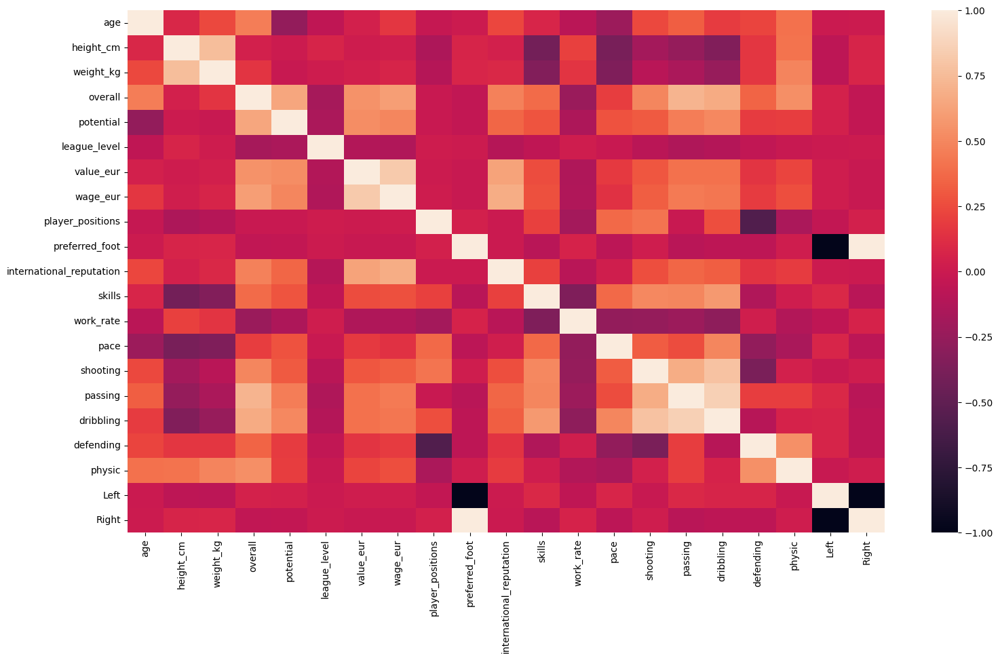

In [ ]:
plt.figure(figsize=(18,10))

sns.heatmap(df_imputed.corr())

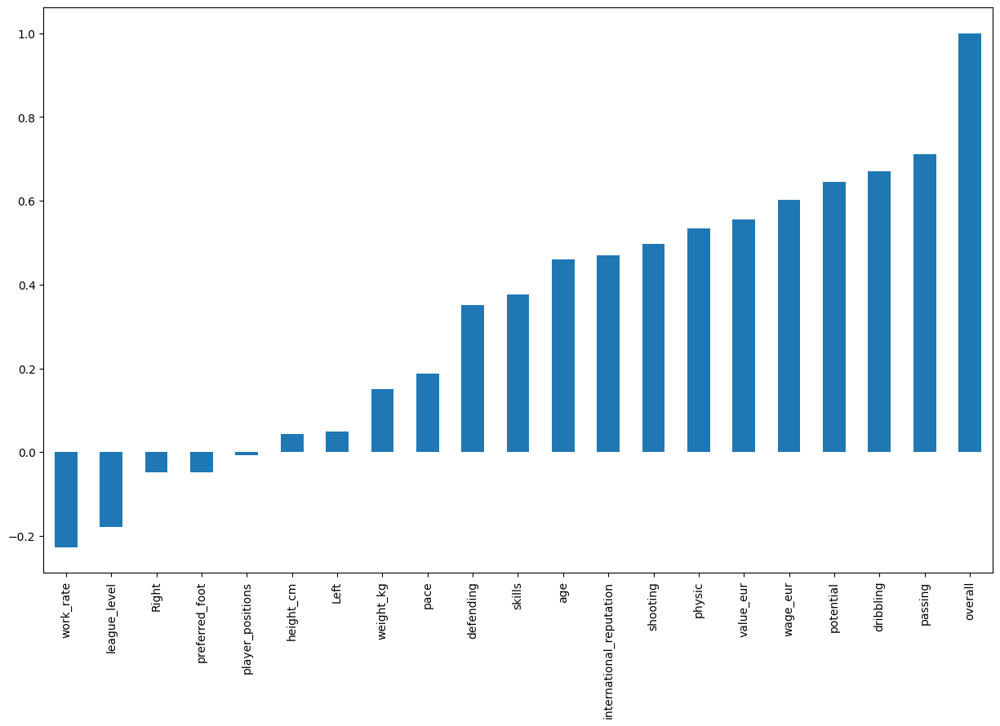

In [ ]:
# Correlational Analysis
fig = plt.figure(figsize=(15,9))
df_imputed.corr()['overall'].sort_values(ascending=True).plot(kind='bar')
plt.show()

In [ ]:
# Categorical Variables Analysis

def plot_categorical(column, target):
    fig = plt.figure()
    sns.countplot(data=df, x=column, hue=target)
    plt.show()
    
column_cat = df.select_dtypes('category')

for _ in column_cat:
    plot_categorical(_, 'overall')


<Figure size 1000x1000 with 0 Axes>

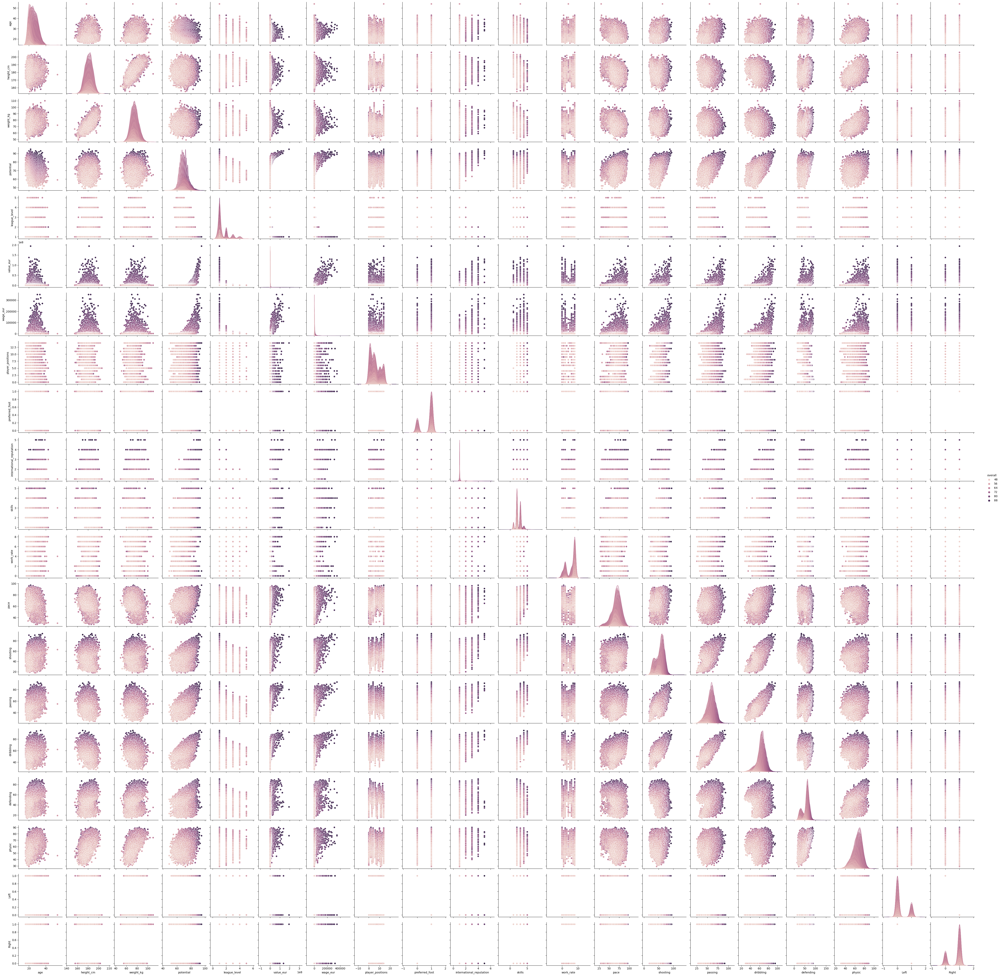

In [ ]:
fig = plt.figure(figsize=(10,10))
sns.pairplot(data= data_encoded, hue='overall')
plt.show()

In [ ]:
# Dummy variables
df_processing_lr1 = pd.get_dummies(data_encoded)

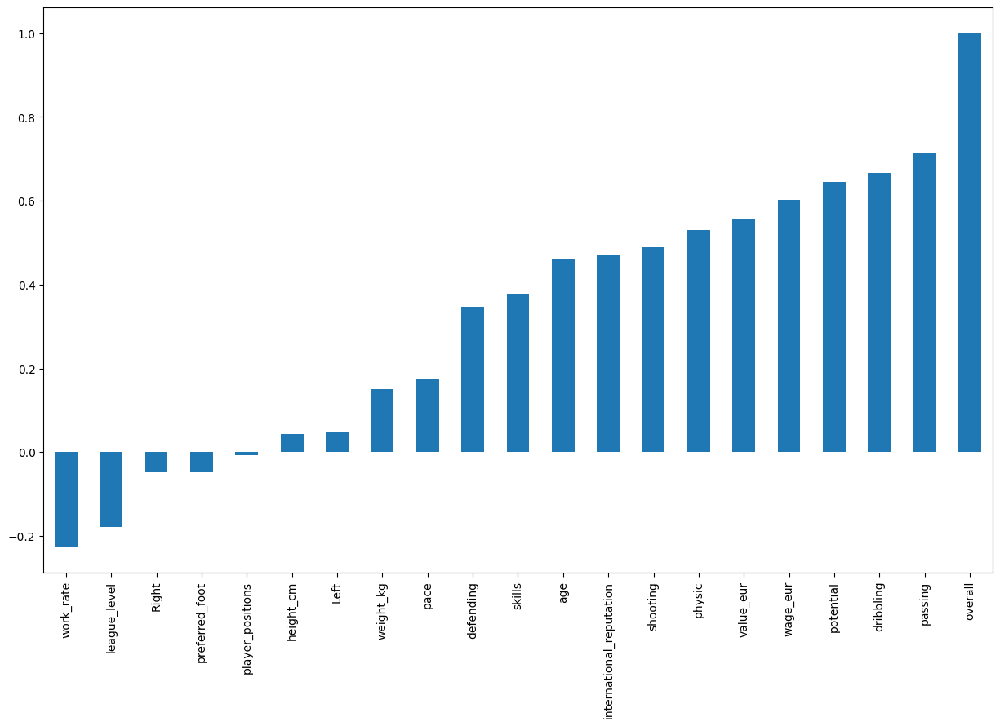

In [ ]:
# Correlational Analysis
fig = plt.figure(figsize=(15,9))
df_processing_lr1.corr()['overall'].sort_values(ascending=True).plot(kind='bar')
plt.show()

## Prediction using Linear Regression

#### We will use RFECV to collect the optimal features to train our model

We eliminate the potential since we can see that these are 2 highly dependent variables

In [ ]:
from sklearn.feature_selection import RFECV
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error

X = df_imputed.drop(columns=['overall','potential'])
y = df_imputed['overall']

model = LinearRegression()

rfecv = RFECV(estimator=model, scoring='neg_mean_squared_error')

X_selected = rfecv.fit_transform(X, y)

print('Optimal number of features: {}'.format(rfecv.n_features_))

selected_features = X.columns[rfecv.support_]
print('Selected features:')
print(selected_features)


Optimal number of features: 16
Selected features:
Index(['age', 'height_cm', 'weight_kg', 'league_level', 'player_positions',
       'preferred_foot', 'international_reputation', 'skills', 'work_rate',
       'pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic',
       'Left'],
      dtype='object')


**We make the train and test datasets**

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score


pipeline = Pipeline([
    ('standardscaler', StandardScaler()),
    ('linearregression', LinearRegression())
])

pipeline.fit(X_train, y_train)

y_pred_test = pipeline.predict(X_test)
mse_test = mean_squared_error(y_test, y_pred_test)
rmse_test = np.sqrt(mse_test)
r2_test = r2_score(y_test, y_pred_test)
print('MSE test:', mse_test)
print('RMSE test:', rmse_test)
print('R-squared test:', r2_test)
print('----------------------------')
y_pred = pipeline.predict(X)
mse = mean_squared_error(y, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y, y_pred)
print('MSE all:', mse)
print('RMSE all:', rmse)
print('R-squared all:', r2)


MSE test: 8.730435728974319
RMSE test: 2.9547310755759684
R-squared test: 0.8134447643767773
----------------------------
MSE all: 8.83677239577183
RMSE all: 2.9726709195220096
R-squared all: 0.8133146922165225


In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score


rf = RandomForestRegressor(random_state=42)


rf.fit(X_train, y_train)


y_pred_test_rfg = rf.predict(X_test)


mse_test = mean_squared_error(y_test, y_pred_test_rfg)
rmse_test = np.sqrt(mse_test)
r2_test = r2_score(y_test, y_pred_test_rfg)


y_pred_rfg = rf.predict(X)
mse_all = mean_squared_error(y, y_pred_rfg)
rmse_all = np.sqrt(mse_all)
r2_all = r2_score(y, y_pred_rfg)


print("MSE test:", mse_test)
print("RMSE test:", rmse_test)
print("R-squared test:", r2_test)
print("---------------------------")
print("MSE all:", mse_all)
print("RMSE all:", rmse_all)
print("R-squared all:", r2_all)


#### Real vs Predicted

In [ ]:
#We plot the scatter for the linear regression model
data1 = pd.DataFrame({'Real': y_test, 'Predicted': y_pred_test})

sns.scatterplot(data=data1, x='Real', y='Predicted')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=3)
plt.xlabel('Real')
plt.ylabel('Predicted')
plt.show()

#We plot the scatter for the random forest regresson
data2 = pd.DataFrame({'Real': y_test, 'Predicted': y_pred_test_rfg})

sns.scatterplot(data=data2, x='Real', y='Predicted')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=3)
plt.xlabel('Real')
plt.ylabel('Predicted')
plt.show()

### As we can conclude the random forest have a higher performance than the linear regression model